In [2]:
from transformers import AutoTokenizer, AutoModel
tokenizer = AutoTokenizer.from_pretrained("emilyalsentzer/Bio_ClinicalBERT")
model = AutoModel.from_pretrained("emilyalsentzer/Bio_ClinicalBERT")

KeyboardInterrupt: 

In [6]:
from sentence_transformers import SentenceTransformer
model = SentenceTransformer("emilyalsentzer/Bio_ClinicalBERT")

#Our sentences we like to encode
# sentences = ['This framework generates embeddings for each input sentence',
#     'Sentences are passed as a list of string.',
#     'The quick brown fox jumps over the lazy dog.']

# #Sentences are encoded by calling model.encode()
# embeddings = model.encode(sentences)

# #Print the embeddings
# for sentence, embedding in zip(sentences, embeddings):
#     print("Sentence:", sentence)
#     print("Embedding:", embedding)
#     print("")

No sentence-transformers model found with name /home/henryng/.cache/torch/sentence_transformers/emilyalsentzer_Bio_ClinicalBERT. Creating a new one with MEAN pooling.
Some weights of the model checkpoint at /home/henryng/.cache/torch/sentence_transformers/emilyalsentzer_Bio_ClinicalBERT were not used when initializing BertModel: ['cls.predictions.transform.dense.weight', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.decoder.weight', 'cls.seq_relationship.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertFo

In [7]:
import pandas as pd


icd_names = pd.read_csv('data/mimic3/raw/D_ICD_DIAGNOSES.csv.gz')
icd_names

,ROW_ID,ICD9_CODE,SHORT_TITLE,LONG_TITLE
0,174,01166,TB pneumonia-oth test,"Tuberculous pneumonia [any form], tubercle bac..."
1,175,01170,TB pneumothorax-unspec,"Tuberculous pneumothorax, unspecified"
2,176,01171,TB pneumothorax-no exam,"Tuberculous pneumothorax, bacteriological or h..."
3,177,01172,TB pneumothorx-exam unkn,"Tuberculous pneumothorax, bacteriological or h..."
4,178,01173,TB pneumothorax-micro dx,"Tuberculous pneumothorax, tubercle bacilli fou..."
...,...,...,...,...
14562,14432,V7399,Scrn unspcf viral dis,Special screening examination for unspecified ...
14563,14433,V740,Screening for cholera,Screening examination for cholera
14564,14434,V741,Screening-pulmonary TB,Screening examination for pulmonary tuberculosis
14565,14435,V742,Screening for leprosy,Screening examination for leprosy (Hansen's di...


In [5]:
icd_names = icd_names[['ICD9_CODE','LONG_TITLE']]
icd_names

,ICD9_CODE,LONG_TITLE
0,01166,"Tuberculous pneumonia [any form], tubercle bac..."
1,01170,"Tuberculous pneumothorax, unspecified"
2,01171,"Tuberculous pneumothorax, bacteriological or h..."
3,01172,"Tuberculous pneumothorax, bacteriological or h..."
4,01173,"Tuberculous pneumothorax, tubercle bacilli fou..."
...,...,...
14562,V7399,Special screening examination for unspecified ...
14563,V740,Screening examination for cholera
14564,V741,Screening examination for pulmonary tuberculosis
14565,V742,Screening examination for leprosy (Hansen's di...


In [8]:
add_icd_names = pd.read_csv('add_icd.csv')
add_icd_names

,ICD9_CODE,LONG_TITLE
0,5968,Other specified disorders of bladder
1,4538,Acute venous embolism and thrombosis of other ...
2,5185,Pulmonary insufficiency following trauma and s...
3,2841,Pancytopenia
4,585,Chronic kidney disease
...,...,...
206,7819,Other symptoms involving nervous and musculosk...
207,87357,Open wound of face complicated
208,87959,Open wound of abdominal wall lateral complicated
209,5232,Gingival recession


icd_names = pd.concat([icd_names,add_icd_names])

In [9]:
icd_names = pd.concat([icd_names,add_icd_names],ignore_index=True)

In [10]:
icd_names

,ROW_ID,ICD9_CODE,SHORT_TITLE,LONG_TITLE
0,174.0,01166,TB pneumonia-oth test,"Tuberculous pneumonia [any form], tubercle bac..."
1,175.0,01170,TB pneumothorax-unspec,"Tuberculous pneumothorax, unspecified"
2,176.0,01171,TB pneumothorax-no exam,"Tuberculous pneumothorax, bacteriological or h..."
3,177.0,01172,TB pneumothorx-exam unkn,"Tuberculous pneumothorax, bacteriological or h..."
4,178.0,01173,TB pneumothorax-micro dx,"Tuberculous pneumothorax, tubercle bacilli fou..."
...,...,...,...,...
14773,NaN,7819,NaN,Other symptoms involving nervous and musculosk...
14774,NaN,87357,NaN,Open wound of face complicated
14775,NaN,87959,NaN,Open wound of abdominal wall lateral complicated
14776,NaN,5232,NaN,Gingival recession


In [11]:
code_name_mapping = {}
for _,row in icd_names.iterrows():
    code_name_mapping[row['ICD9_CODE']] =  row['LONG_TITLE']

In [12]:
len(code_name_mapping)

14778

In [13]:
embedding_mapping = {}
from tqdm import tqdm

for code in tqdm(code_name_mapping):
    code_title = code_name_mapping[code]
    code_title = code_title.lower()
    code_title = code_title.replace('(','')
    code_title = code_title.replace(')','')
    code_title = code_title.replace('[','')
    code_title = code_title.replace(']','')
    code_title = code_title.replace(',','')
    code_title = code_title.replace('-','')
    code_title = code_title.replace('/','')
    embedding = model.encode([code_title])

    code = str(code)
    split_pos = 4 if code.startswith('E') else 3
    code = code[:split_pos] + '.' + code[split_pos:] if len(code) > split_pos else code
    # print(code,code_title)

    embedding_mapping[code] = {'title':code_title, 'embedding':embedding}
    # break
    # print(code,code_title)
    # break
    # print(embedding.shape, type(embedding))


    # print(code_title)
    # print(code)



100%|██████████| 14778/14778 [00:53<00:00, 273.82it/s]


In [14]:
embedding_mapping

{'011.66': {'title': 'tuberculous pneumonia any form tubercle bacilli not found by bacteriological or histological examination but tuberculosis confirmed by other methods inoculation of animals',
  'embedding': array([[ 3.59944075e-01, -3.58558819e-02, -5.16119748e-02,
          -8.03931057e-03,  1.70949787e-01,  8.01821947e-02,
           7.64461383e-02, -1.47817016e-01, -7.44476765e-02,
          -8.05537477e-02,  2.64936388e-01,  3.67889330e-02,
          -3.35143954e-01,  2.70675272e-01, -4.11360830e-01,
          -6.08495958e-02,  1.65904284e-01, -3.64584811e-02,
          -4.09270898e-02, -3.03800881e-01, -4.17736143e-01,
          -1.16425589e-01, -1.66224077e-01, -2.66548067e-01,
          -3.18613425e-02, -1.84788659e-01, -3.36987585e-01,
           3.66677165e-01,  8.15119967e-02,  2.89846897e-01,
           9.42762643e-02,  1.91314802e-01, -2.49535948e-01,
           9.75432172e-02,  3.99119139e-01,  1.68781076e-02,
           6.29599169e-02,  3.85563225e-01, -2.03048944e-01

In [15]:
import pickle
with open('data/icd_embeddings.pickle', 'wb') as handle:
    pickle.dump(embedding_mapping, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [16]:
import pickle
with open('data/icd_embeddings.pickle', 'rb') as handle:
    embedding_mapping = pickle.load(handle)

In [17]:
with open('data/mimic3/encoded/code_map.pkl', 'rb') as f:
    code_map = pickle.load(f)
    print(code_map)

OrderedDict([('414.01', 0), ('411.1', 1), ('424.1', 2), ('V45.82', 3), ('272.4', 4), ('401.9', 5), ('600.00', 6), ('389.9', 7), ('225.2', 8), ('348.5', 9), ('780.39', 10), ('272.0', 11), ('V45.81', 12), ('V45.79', 13), ('V15.82', 14), ('410.71', 15), ('428.0', 16), ('425.4', 17), ('427.31', 18), ('997.1', 19), ('426.0', 20), ('E879.0', 21), ('427.89', 22), ('428.22', 23), ('426.3', 24), ('V58.61', 25), ('244.9', 26), ('365.9', 27), ('496', 28), ('305.1', 29), ('530.81', 30), ('V10.51', 31), ('596.8', 32), ('998.31', 33), ('998.11', 34), ('415.11', 35), ('453.8', 36), ('996.72', 37), ('553.21', 38), ('518.5', 39), ('486', 40), ('997.39', 41), ('518.0', 42), ('414.00', 43), ('300.00', 44), ('571.5', 45), ('572.2', 46), ('286.7', 47), ('456.20', 48), ('345.3', 49), ('482.41', 50), ('518.81', 51), ('572.3', 52), ('795.89', 53), ('250.00', 54), ('V58.67', 55), ('573.9', 56), ('038.10', 57), ('995.92', 58), ('599.0', 59), ('155.0', 60), ('584.9', 61), ('427.1', 62), ('728.88', 63), ('785.52'

In [18]:
len(code_map)

4825

In [19]:
from tqdm import tqdm

In [20]:
mimic3_embeddings = []
# unavailable =
for code in tqdm(code_map):
    code = str(code)
    # code = code.replace('.','')
    # print(code)
    # if code == '':
    #     return code
    # split_pos = 4 if code.startswith('E') else 3
    # icd9_code = code[:split_pos] + '.' + code[split_pos:] if len(code) > split_pos else code
    try:
        embedding = embedding_mapping[code]['embedding']
        embedding = embedding[0]
        mimic3_embeddings.append(embedding)
    except:
        # print(code)
        raw_code = code.replace('.','')
        print(raw_code)
        # subcodes = []
        # for i in range()

    # embedding

    # print(embedding.shape)
    # break
    # print(i)

100%|██████████| 4825/4825 [00:00<00:00, 1300528.04it/s]


In [21]:
len(mimic3_embeddings)

4825

In [22]:
!pip install umap-learn

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


In [23]:
import umap

reducer = umap.UMAP(n_neighbors=15,min_dist=0.25,n_components=64)



In [24]:
import numpy as np
mimic3_embeddings_final = np.stack(mimic3_embeddings,axis=0)
mimic3_embeddings_final.shape

(4825, 768)

In [25]:
transformed_mimic3 = reducer.fit_transform(mimic3_embeddings_final)

In [26]:
transformed_mimic3.shape

(4825, 64)

In [28]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

mimic3_embeddings = scaler.fit_transform(transformed_mimic3)

In [29]:
mimic3_embeddings

array([[ 0.04338683,  0.14565851,  0.33947077, ...,  0.16252218,
        -0.39500275, -0.58054227],
       [ 0.03955128,  0.17135818,  0.2429896 , ..., -0.04338396,
        -0.27914053, -0.58216524],
       [ 0.01705628,  0.01330754,  0.7278152 , ..., -1.3510443 ,
         0.42376518,  0.6054208 ],
       ...,
       [ 0.10307438,  0.21444291,  0.7402195 , ..., -0.452264  ,
        -1.4170414 ,  0.05554464],
       [ 0.08176503,  0.17154142,  0.03074634, ...,  0.9486757 ,
        -0.33049795, -0.36348882],
       [ 0.10822085,  0.17917344,  0.45158425, ...,  2.0974488 ,
        -0.5017096 ,  0.239824  ]], dtype=float32)

In [27]:
import umap.plot

/home/henryng/anaconda3/envs/dungnt/lib/python3.9/site-packages/umap/plot.py:20: UserWarning: The umap.plot package requires extra plotting libraries to be installed.
    You can install these via pip using

    pip install umap-learn[plot]

    or via conda using

     conda install pandas matplotlib datashader bokeh holoviews colorcet scikit-image
    
  warn(


ImportError: umap.plot requires pandas matplotlib datashader bokeh holoviews scikit-image and colorcet to be installed

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


<AxesSubplot: >

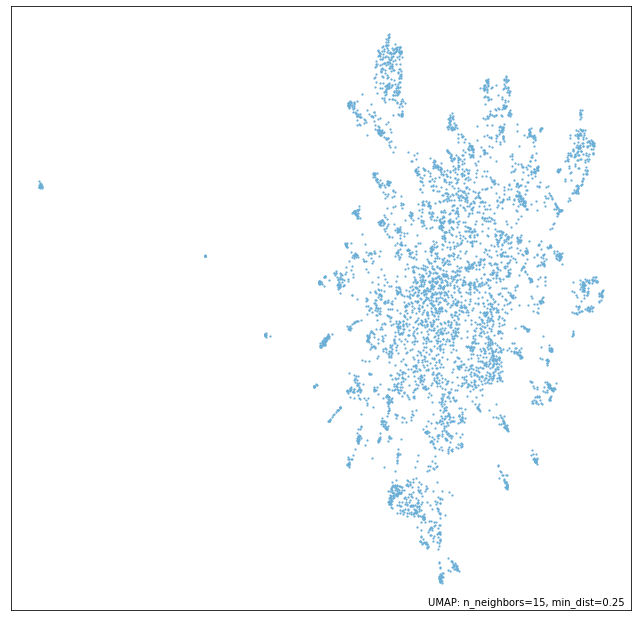

In [30]:
umap.plot.points(reducer)

In [31]:
import torch

In [73]:
state_dict = torch.load('data/params/mimic3/diabetes/best_bert_1.pt')

In [74]:
state_dict.keys()

odict_keys(['embedding_layer.c_embeddings', 'embedding_layer.n_embeddings', 'embedding_layer.u_embeddings', 'graph_layer.dense.weight', 'graph_layer.dense.bias', 'transition_layer.gru.weight_ih', 'transition_layer.gru.weight_hh', 'transition_layer.gru.bias_ih', 'transition_layer.gru.bias_hh', 'transition_layer.single_head_attention.dense_q.weight', 'transition_layer.single_head_attention.dense_q.bias', 'transition_layer.single_head_attention.dense_k.weight', 'transition_layer.single_head_attention.dense_k.bias', 'transition_layer.single_head_attention.dense_v.weight', 'transition_layer.single_head_attention.dense_v.bias', 'attention.context', 'attention.dense.weight', 'attention.dense.bias', 'classifier.linear.weight', 'classifier.linear.bias'])

In [75]:
embedding = state_dict['embedding_layer.c_embeddings'].detach().cpu().numpy()

In [69]:
embedding = np.load('data/mimic3/bert_umap_embeddings.npy')

In [76]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(embedding)

/mnt/disk1/hieunm/anaconda3/envs/duy/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/mnt/disk1/hieunm/anaconda3/envs/duy/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 4825 samples in 0.001s...
[t-SNE] Computed neighbors for 4825 samples in 1.356s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4825
[t-SNE] Computed conditional probabilities for sample 2000 / 4825
[t-SNE] Computed conditional probabilities for sample 3000 / 4825
[t-SNE] Computed conditional probabilities for sample 4000 / 4825
[t-SNE] Computed conditional probabilities for sample 4825 / 4825
[t-SNE] Mean sigma: 1.227356


[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.129539
[t-SNE] KL divergence after 300 iterations: 1.270334


In [77]:
tsne_results

array([[12.943246 ,  7.845642 ],
       [ 9.407211 ,  6.7378407],
       [ 6.451111 , -5.4542303],
       ...,
       [ 1.8644593,  2.8135371],
       [-2.8054752,  3.484255 ],
       [13.013308 , -5.7149696]], dtype=float32)

<ipython-input-79-f690fa76f5b2>:8: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(


<AxesSubplot: xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

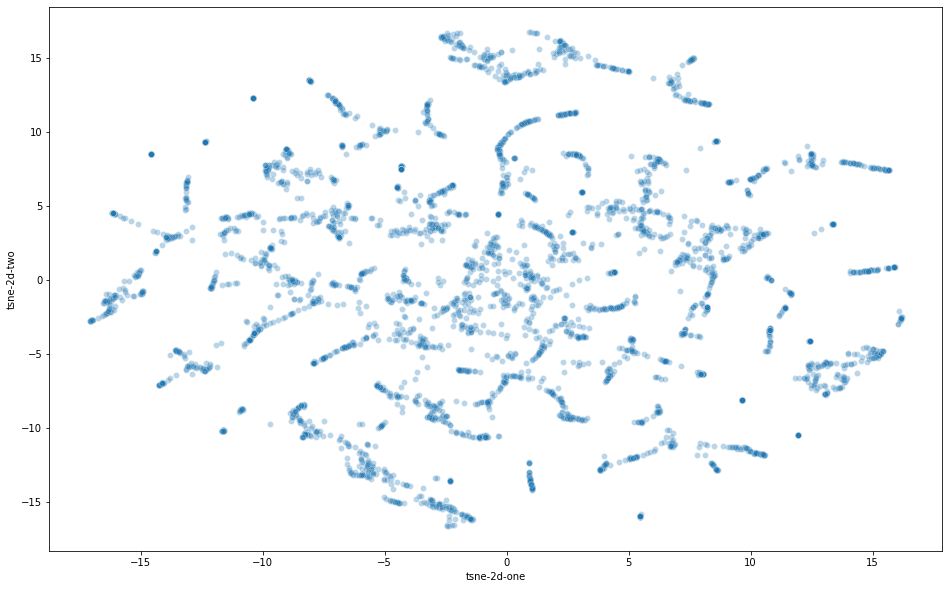

In [79]:
import matplotlib.pyplot as plt
import seaborn as sns
df_subset = pd.DataFrame() #creates a new dataframe that's empty
df_subset['tsne-2d-one'] = tsne_results[:,0]
df_subset['tsne-2d-two'] = tsne_results[:,1]

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    palette=sns.color_palette("hls", 10),
    data=df_subset,
    legend="full",
    alpha=0.3
)

<ipython-input-72-f690fa76f5b2>:8: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(


<AxesSubplot: xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

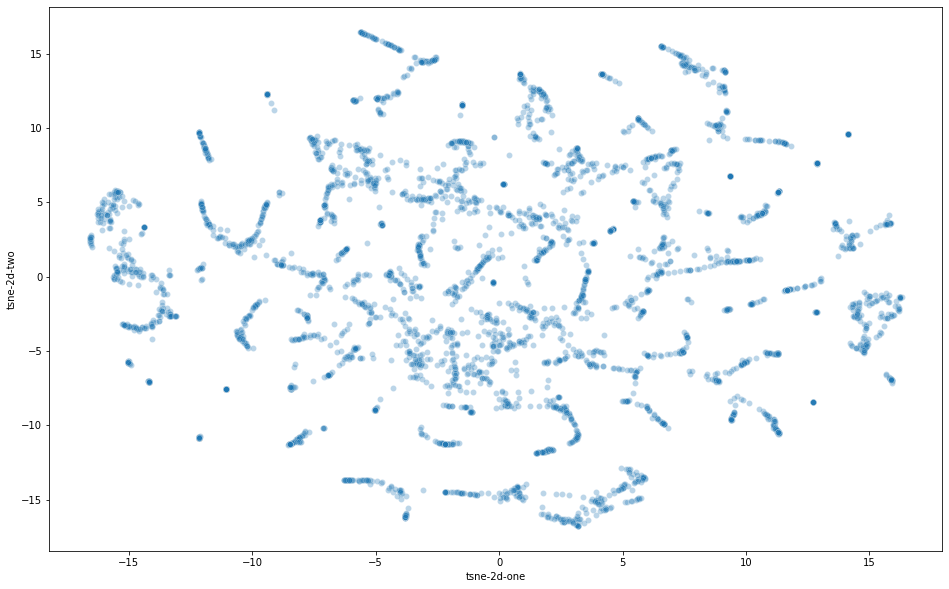

In [72]:
import matplotlib.pyplot as plt
import seaborn as sns
df_subset = pd.DataFrame() #creates a new dataframe that's empty
df_subset['tsne-2d-one'] = tsne_results[:,0]
df_subset['tsne-2d-two'] = tsne_results[:,1]

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    palette=sns.color_palette("hls", 10),
    data=df_subset,
    legend="full",
    alpha=0.3
)

<ipython-input-64-f690fa76f5b2>:8: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(


<AxesSubplot: xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

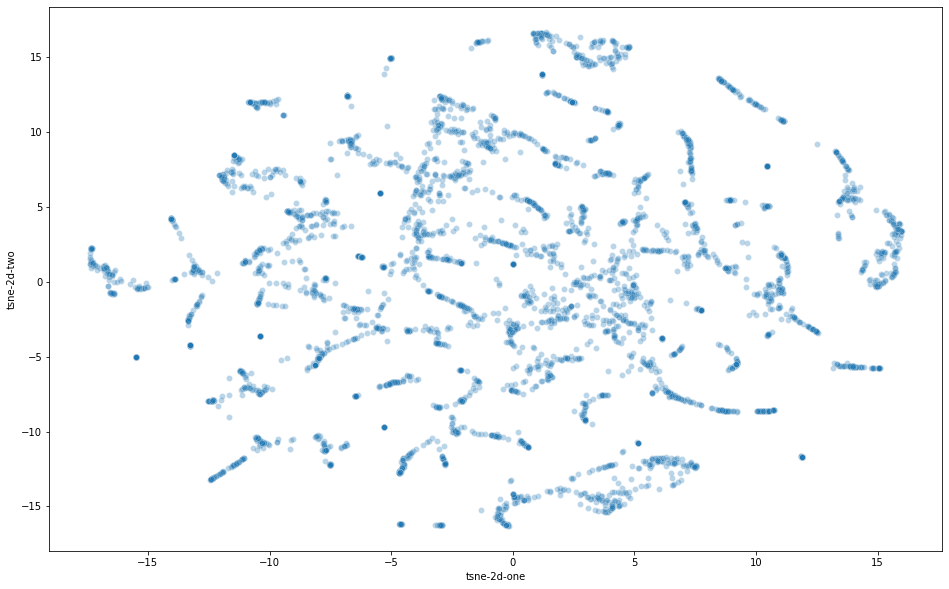

In [64]:
import matplotlib.pyplot as plt
import seaborn as sns
df_subset = pd.DataFrame() #creates a new dataframe that's empty
df_subset['tsne-2d-one'] = tsne_results[:,0]
df_subset['tsne-2d-two'] = tsne_results[:,1]

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    palette=sns.color_palette("hls", 10),
    data=df_subset,
    legend="full",
    alpha=0.3
)

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
df_subset = pd.DataFrame() #creates a new dataframe that's empty
df_subset['tsne-2d-one'] = tsne_results[:,0]
df_subset['tsne-2d-two'] = tsne_results[:,1]

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    palette=sns.color_palette("hls", 10),
    data=df_subset,
    legend="full",
    alpha=0.3
)

<ipython-input-46-f690fa76f5b2>:8: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(


<AxesSubplot: xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

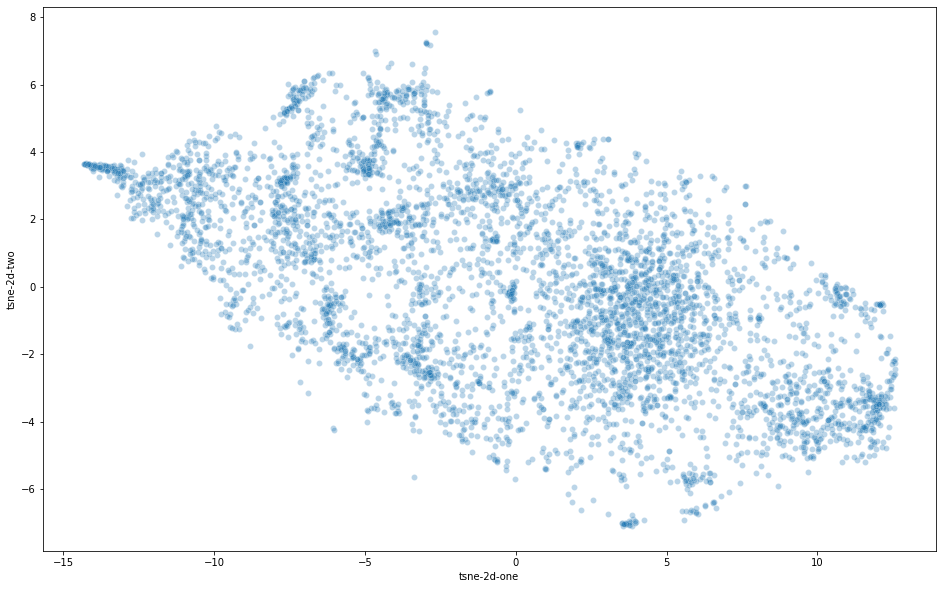

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns
df_subset = pd.DataFrame() #creates a new dataframe that's empty
df_subset['tsne-2d-one'] = tsne_results[:,0]
df_subset['tsne-2d-two'] = tsne_results[:,1]

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    palette=sns.color_palette("hls", 10),
    data=df_subset,
    legend="full",
    alpha=0.3
)

<ipython-input-40-f690fa76f5b2>:8: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(


<AxesSubplot: xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

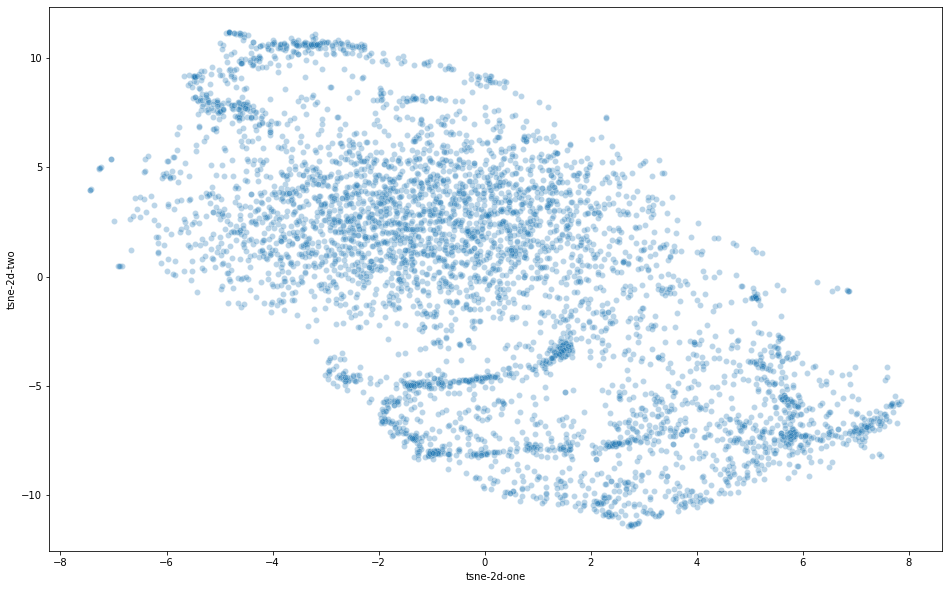

In [40]:
import matplotlib.pyplot as plt
import seaborn as sns
df_subset = pd.DataFrame() #creates a new dataframe that's empty
df_subset['tsne-2d-one'] = tsne_results[:,0]
df_subset['tsne-2d-two'] = tsne_results[:,1]

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    palette=sns.color_palette("hls", 10),
    data=df_subset,
    legend="full",
    alpha=0.3
)

In [19]:
transformed_mimic3

array([[10.060114 , 10.07555  ,  9.102675 , ...,  3.7809434,  6.807133 ,
         5.004098 ],
       [10.058995 , 10.084922 ,  9.126155 , ...,  3.711259 ,  6.799508 ,
         4.9889627],
       [10.0074005, 10.00521  ,  9.479934 , ...,  3.7086945,  6.692461 ,
         4.943819 ],
       ...,
       [10.0540905, 10.04907  ,  9.271593 , ...,  3.657563 ,  6.825638 ,
         4.9292345],
       [10.034    , 10.012125 ,  8.6257715, ...,  3.7545264,  6.778467 ,
         4.9120846],
       [10.0719595, 10.005807 ,  8.777827 , ...,  3.794053 ,  6.9218645,
         4.829001 ]], dtype=float32)

In [53]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

mimic3_embeddings = scaler.fit_transform(transformed_mimic3)

In [56]:
mimic3_embeddings.shape

(4825, 64)

In [57]:
np.save('data/mimic3/bert_umap_embeddings.npy', mimic3_embeddings)    # .npy extension is added if not given

In [8]:
with open('data/mimic4/encoded/code_map.pkl', 'rb') as f:
    code_map = pickle.load(f)
    print(code_map)

OrderedDict([('332.0', 0), ('585.1', 1), ('357.9', 2), ('285.1', 3), ('997.49', 4), ('427.31', 5), ('496', 6), ('276.51', 7), ('576.8', 8), ('250.00', 9), ('278.00', 10), ('338.29', 11), ('574.50', 12), ('401.9', 13), ('715.90', 14), ('530.81', 15), ('724.2', 16), ('389.9', 17), ('V58.67', 18), ('V85.23', 19), ('V15.82', 20), ('E878.6', 21), ('E849.7', 22), ('998.59', 23), ('572.0', 24), ('996.1', 25), ('E878.8', 26), ('E879.8', 27), ('V45.79', 28), ('600.01', 29), ('788.20', 30), ('274.9', 31), ('403.90', 32), ('585.9', 33), ('V17.3', 34), ('V16.7', 35), ('V16.42', 36), ('V18.0', 37), ('V12.54', 38), ('V10.46', 39), ('296.54', 40), ('V62.84', 41), ('300.00', 42), ('564.09', 43), ('V45.77', 44), ('729.5', 45), ('692.9', 46), ('V12.29', 47), ('V15.41', 48), ('V17.0', 49), ('447.1', 50), ('440.20', 51), ('707.15', 52), ('250.40', 53), ('403.10', 54), ('585.4', 55), ('272.4', 56), ('250.50', 57), ('362.05', 58), ('250.70', 59), ('730.27', 60), ('250.80', 61), ('731.8', 62), ('585.3', 63),

In [14]:
add_map = {'87959':"Open wound of abdominal wall lateral complicated",
'5232':'Gingival recession',
'5213':'Erosion of teeth'}

In [13]:
len(code_map)

6064

In [15]:
mimic4_embeddings = []
from tqdm import tqdm
# unavailable =
for code in tqdm(code_map):
    code = str(code)
    # code = code.replace('.','')
    # print(code)
    # if code == '':
    #     return code
    # split_pos = 4 if code.startswith('E') else 3
    # icd9_code = code[:split_pos] + '.' + code[split_pos:] if len(code) > split_pos else code
    try:
        embedding = embedding_mapping[code]['embedding']
        embedding = embedding[0]
        mimic4_embeddings.append(embedding)
    except:
        # print(code)
        raw_code = code.replace('.','')
        print(raw_code)
        mimic4_embeddings.append(model.encode([add_map[raw_code.lower()]])[0])
        # subcodes = []
        # for i in range()

    # embedding

    # print(embedding.shape)
    # break
    # print(i)

100%|██████████| 6064/6064 [00:00<00:00, 310749.92it/s]


In [16]:
len(mimic4_embeddings)

6064

In [17]:
import numpy as np
mimic4_embeddings_final = np.stack(mimic4_embeddings,axis=0)
mimic4_embeddings_final.shape

(6064, 768)

In [18]:
import umap
reducer = umap.UMAP(n_neighbors=15,min_dist=0.1,n_components=64, metric = 'cosine')


In [19]:
transformed_mimic4 = reducer.fit_transform(mimic4_embeddings_final)

In [20]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

scaler = MinMaxScaler((-1,1))

mimic4_embeddings = scaler.fit_transform(transformed_mimic4)

In [21]:
mimic4_embeddings

array([[ 0.8110354 ,  0.94297826,  0.01960027, ...,  0.2660203 ,
        -0.24873161,  0.17490101],
       [ 0.8734486 ,  0.96479595,  0.12894964, ...,  0.30811548,
        -0.25341225,  0.63754845],
       [ 0.911494  ,  0.9660994 ,  0.08654785, ...,  0.40258121,
        -0.16155243,  0.07555199],
       ...,
       [ 0.8499446 ,  0.9535923 ,  0.27114844, ...,  0.21975136,
        -0.20626259,  0.07473087],
       [ 0.8007314 ,  0.9425663 ,  0.06891048, ...,  0.22924566,
        -0.2720337 ,  0.13883018],
       [ 0.8457639 ,  0.9742366 ,  0.368567  , ...,  0.13341427,
        -0.18258476, -0.29582024]], dtype=float32)

In [23]:
np.save('data/mimic4/bert_umap_embeddings.npy', mimic4_embeddings)    # .npy extension is added if not given

In [18]:
embedding_mapping['41401']

KeyError: '41401'